In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import shutil
import random
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
from IPython.display import display

# 데이터 디렉토리 설정
image_dir = 'datasets/data/images'
label_dir = 'datasets/data/labels'
train_image_dir = 'datasets/train/images'
train_label_dir = 'datasets/train/labels'
valid_image_dir = 'datasets/valid/images'
valid_label_dir = 'datasets/valid/labels'
aug_train_image_dir = 'datasets/augmented/train/images'
aug_train_label_dir = 'datasets/augmented/train/labels'
aug_valid_image_dir = 'datasets/augmented/valid/images'
aug_valid_label_dir = 'datasets/augmented/valid/labels'

# 디렉토리 생성
for d in [train_image_dir, train_label_dir, valid_image_dir, valid_label_dir,
          aug_train_image_dir, aug_train_label_dir, aug_valid_image_dir, aug_valid_label_dir]:
    os.makedirs(d, exist_ok=True)

# 이미지 및 라벨 파일 리스트 가져오기
image_files = {os.path.splitext(f)[0]: os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))}
label_files = {os.path.splitext(f)[0]: os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith('.txt')}

# 이미지와 라벨 비교
valid_split_ratio = 0.2  # 20%를 검증 데이터로 사용
image_keys = list(image_files.keys())
random.shuffle(image_keys)
split_idx = int(len(image_keys) * (1 - valid_split_ratio))
train_keys, valid_keys = image_keys[:split_idx], image_keys[split_idx:]

# 데이터 이동
def move_files(keys, target_img_dir, target_lbl_dir):
    for key in keys:
        img_path = image_files.get(key)
        lbl_path = label_files.get(key)
        if img_path:
            shutil.copy(img_path, os.path.join(target_img_dir, os.path.basename(img_path)))
        if lbl_path:
            shutil.copy(lbl_path, os.path.join(target_lbl_dir, os.path.basename(lbl_path)))

move_files(train_keys, train_image_dir, train_label_dir)
move_files(valid_keys, valid_image_dir, valid_label_dir)

print(f"[INFO] Train Images: {len(train_keys)}, Valid Images: {len(valid_keys)}")

# 데이터프레임 생성 및 출력
df_summary = pd.DataFrame({
    "Category": ["Train Images", "Valid Images"],
    "Count": [len(train_keys), len(valid_keys)]
})
display(df_summary)

# Albumentations Transform 정의
transform = A.Compose([
    A.Rotate(limit=25, p=0.5),  # -15도 ~ +15도 회전
    A.RandomScale(scale_limit=0.2, p=0.5),  # 80% ~ 120% 사이 랜덤 스케일
    A.RandomCrop(width=640, height=640, p=1.0),  # 640x640 크롭
    A.HorizontalFlip(p=0.5),  # 수평 플립
    # A.VerticalFlip(p=0.5),  # 수직 플립
    A.RandomBrightnessContrast(p=0.5),  # 밝기 및 대비 조정
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']))

def apply_augmentation(image, labels):
    h, w, _ = image.shape
    bboxes = []
    category_ids = []
    for label in labels:
        class_id, x_center, y_center, bbox_width, bbox_height = map(float, label)
        x_min = (x_center - bbox_width / 2) * w
        y_min = (y_center - bbox_height / 2) * h
        x_max = (x_center + bbox_width / 2) * w
        y_max = (y_center + bbox_height / 2) * h
        bboxes.append([x_min, y_min, x_max, y_max])
        category_ids.append(int(class_id))
    
    augmented = transform(image=image, bboxes=bboxes, category_ids=category_ids)
    
    new_bboxes = []
    for bbox, class_id in zip(augmented['bboxes'], augmented['category_ids']):
        x_min, y_min, x_max, y_max = bbox
        x_center = ((x_min + x_max) / 2) / 640
        y_center = ((y_min + y_max) / 2) / 640
        bbox_width = (x_max - x_min) / 640
        bbox_height = (y_max - y_min) / 640
        new_bboxes.append(f"{class_id} {x_center} {y_center} {bbox_width} {bbox_height}\n")
    
    return augmented['image'], new_bboxes

def process_augmentation(image_path, label_path, output_img_dir, output_lbl_dir, num_augmentations=10):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    with open(label_path, 'r') as f:
        labels = [line.strip().split() for line in f.readlines()]
    
    for idx in range(num_augmentations):
        aug_img, aug_labels = apply_augmentation(img, labels)
        img_name = os.path.splitext(os.path.basename(image_path))[0]
        new_img_name = f"{img_name}_aug{idx}.jpg"
        new_img_path = os.path.join(output_img_dir, new_img_name)
        cv2.imwrite(new_img_path, cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR))
        
        new_label_path = os.path.join(output_lbl_dir, f"{img_name}_aug{idx}.txt")
        with open(new_label_path, 'w') as f:
            f.writelines(aug_labels)

# Train 데이터에 대해 Augmentation 수행
for img_key in train_keys:
    img_path = os.path.join(train_image_dir, os.path.basename(image_files[img_key]))
    lbl_path = os.path.join(train_label_dir, os.path.basename(label_files[img_key]))
    if os.path.exists(img_path) and os.path.exists(lbl_path):
        process_augmentation(img_path, lbl_path, aug_train_image_dir, aug_train_label_dir, num_augmentations=10)

# Valid 데이터에 대해 Augmentation 수행
for img_key in valid_keys:
    img_path = os.path.join(valid_image_dir, os.path.basename(image_files[img_key]))
    lbl_path = os.path.join(valid_label_dir, os.path.basename(label_files[img_key]))
    if os.path.exists(img_path) and os.path.exists(lbl_path):
        process_augmentation(img_path, lbl_path, aug_valid_image_dir, aug_valid_label_dir, num_augmentations=10)

print("[INFO] Augmentation Completed for Training and Validation Data.")


[INFO] Train Images: 62, Valid Images: 16


,Category,Count
0,Train Images,62
1,Valid Images,16


[INFO] Augmentation Completed for Training and Validation Data.


Labels for -241221-1423-1_262_jpg.rf.17ae7666dd5ee997352c901324d0b73d_aug7.jpg:
0.0 0.2725799284176901 0.7384179161861539 0.03465012456290424 0.024334355257451534

0.0 0.1704123343108222 0.7685523053631187 0.025411204295232893 0.024694726802408695

0.0 0.443291326938197 0.7111655717715621 0.03108405014500022 0.014517825096845627

0.0 0.03285625635180622 0.6999080192297698 0.028508912632241847 0.02673010714352131

0.0 0.21840749150142075 0.8056934165768326 0.03322750767692924 0.021218324080109596

0.0 0.7556471910327673 0.8521647650748492 0.03304758090525865 0.016066912561655045

0.0 0.762400628020987 0.8926920701749623 0.03843239964917302 0.018336511217057705

0.0 0.6831590640824288 0.8959522847551853 0.03781986543908715 0.018948841374367476

0.0 0.6244301826227456 0.7965431911405176 0.03216484738513827 0.02395624341443181

0.0 0.9362997497897595 0.7483066250104458 0.03490228997543454 0.016967493575066328

0.0 0.4905661072116345 0.727214396186173 0.0315523131750524 0.014031532220542431

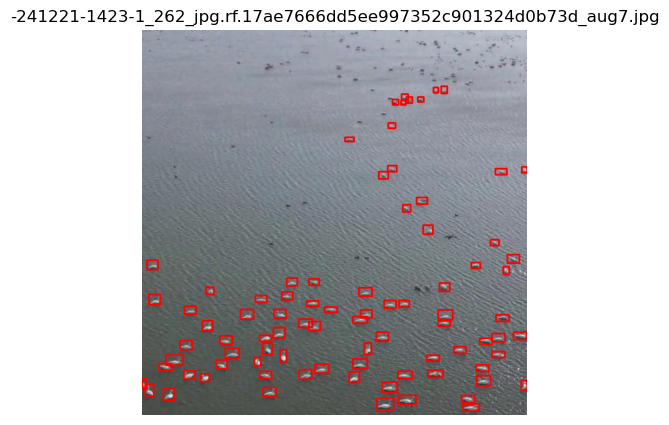

Labels for -250206-1435-1_114_jpg.rf.d7312147f30a731c5ec03969edec7c58_aug8.jpg:



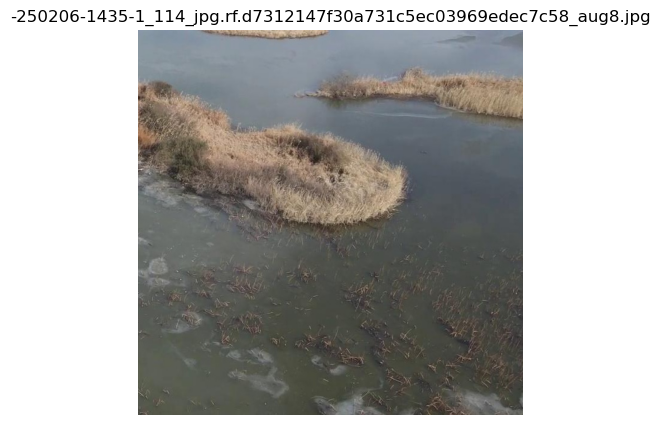

Labels for -250206-1435-1_043_jpg.rf.d1862fce2c8e8db82cea13f8125e7ec3_aug1.jpg:



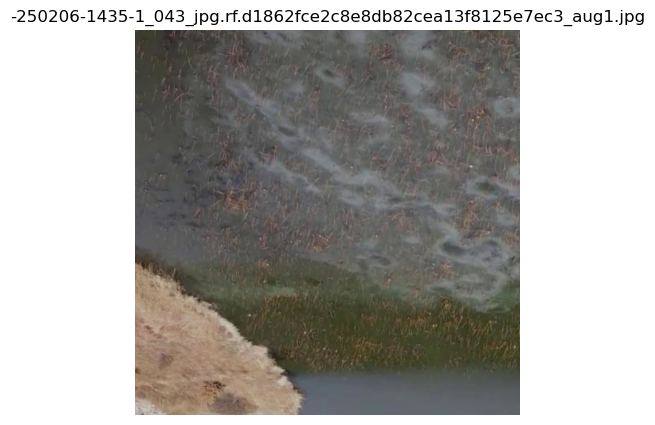

Labels for -250108-0934-1_002_jpg.rf.9b0a1dfa0c1c4a4bfae86b2dc08eaa3d_aug3.jpg:



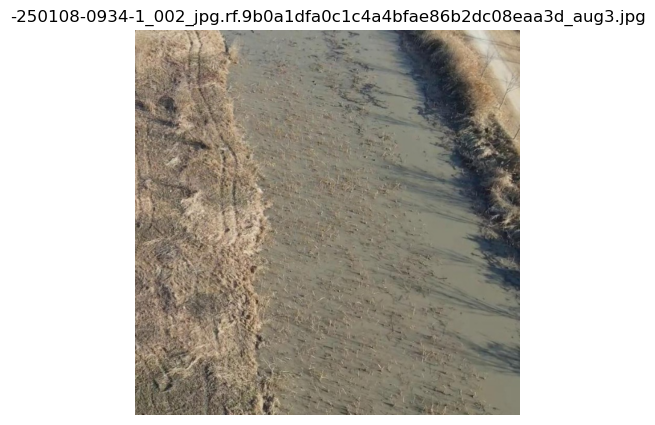

Labels for -250206-1435-1_051_jpg.rf.c36010e256cb2ff2e2eb46640331de19_aug9.jpg:
0.0 0.001620841515250504 0.30326774367131293 0.003241683030501008 0.0077986940741539

0.0 0.00011335250455886125 0.23157960874959826 0.0002267050091177225 0.007217129692435265

0.0 0.00331923917401582 0.2235168085899204 0.00663847834803164 0.0074588581919670105

0.0 0.0024560668505728247 0.2085173149826005 0.004912133701145649 0.006593717960640788

0.0 0.004299772484228015 0.1972652452532202 0.007303079962730408 0.006310647819191217

0.0 0.009679605159908533 0.20503106829710305 0.008143437653779983 0.006695323158055544

0.0 0.01842315380927175 0.2056365484604612 0.007893263408914209 0.0064958634320646524

0.0 0.023503436730243264 0.19438159198034555 0.006527981860563159 0.006760264514014125

0.0 0.03877039682120085 0.21253221633378416 0.006907776184380055 0.006178700132295489

0.0 0.01707345664035529 0.2121896833414212 0.00623712339438498 0.00537639413960278

0.0 0.019167832401581108 0.2203090174589306 0.00

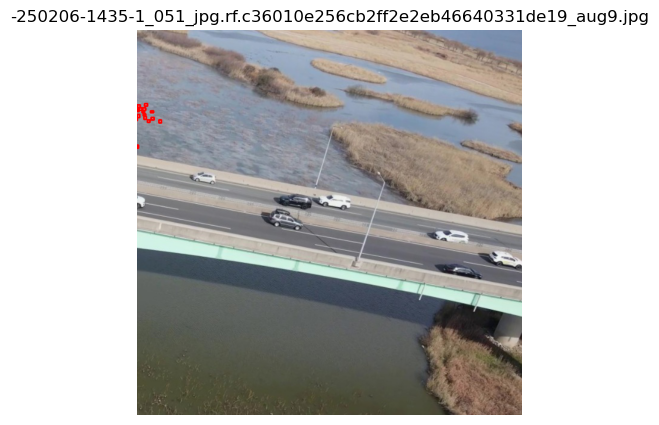

Labels for -241221-1423-1_003_jpg.rf.b0bda02bfbd87dfeba96050d4e5fd42d_aug9.jpg:
0.0 0.6969516485929489 0.5590867690742016 0.014599531888961792 0.011670626699924469

0.0 0.7155238896608352 0.5730864919722081 0.010914534330368042 0.019233249127864838

0.0 0.726566544175148 0.5812857534736395 0.01238223910331726 0.015947308391332626

0.0 0.765085881948471 0.5863932494074107 0.011653304100036621 0.015266362577676773

0.0 0.7463311165571213 0.6115687817335129 0.012725025415420532 0.017070315778255463

0.0 0.7658037304878235 0.6287496883422137 0.01045292615890503 0.014017928391695023

0.0 0.8688355594873428 0.6559927763417364 0.010024935007095337 0.013926247134804726

0.0 0.8505880892276764 0.7210029849782587 0.010176658630371094 0.01123294048011303

0.0 0.826101890206337 0.6770360387861729 0.0210055410861969 0.015171714127063751

0.0 0.8251789420843124 0.6672503344714642 0.028508037328720093 0.015424076467752457

0.0 0.8200850695371628 0.657018193230033 0.010209470987319946 0.01403864845633

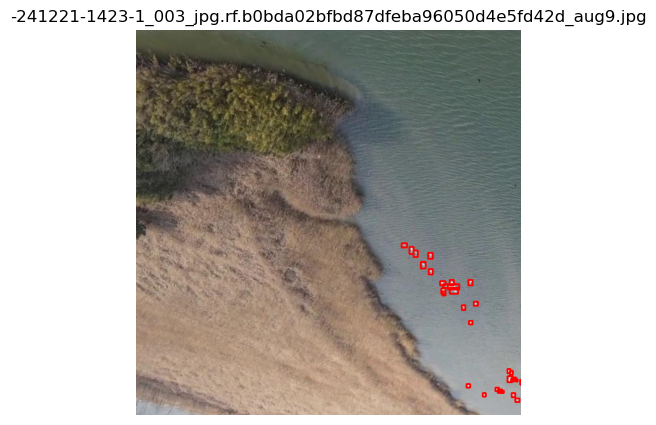

Labels for -250206-1435-1_002_jpg.rf.f495e1a51b39107a6c9f71073ef1d540_aug0.jpg:



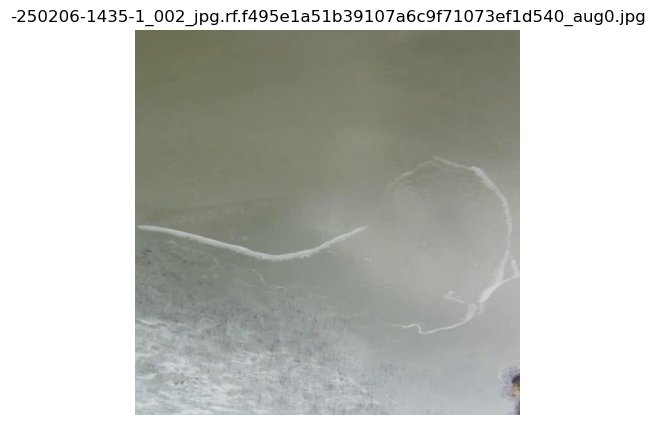

Labels for -250206-1435-1_029_jpg.rf.a5bfa9bf1ec7c727f1fb922133703ee7_aug6.jpg:



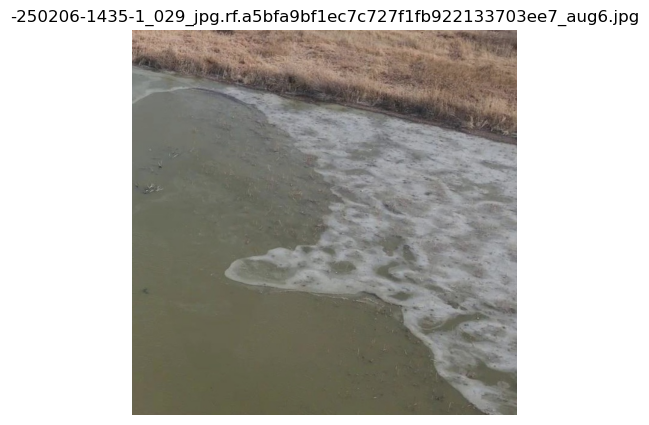

Labels for -241221-1423-1_052_jpg.rf.3331eb5c88b848e3bda32e05c249bb79_aug4.jpg:
0.0 0.19076652228832244 0.5338884197175503 0.010470002889633179 0.011936768889427185

0.0 0.18778806328773498 0.5270383764058352 0.013264238834381104 0.01445767655968666

0.0 0.19707244038581848 0.02648848630487921 0.017607450485229492 0.017361503094434738

0.0 0.2625314831733704 0.09350834004580977 0.020072221755981445 0.017211835831403732

0.0 0.24979304671287536 0.17089496515691283 0.02128779888153076 0.022599656134843826

0.0 0.31509401798248293 0.19080010764300823 0.02437305450439453 0.024628009647130945

0.0 0.4115516185760498 0.19028834216296675 0.018853962421417236 0.016276013106107712

0.0 0.30539595484733584 0.2082008883357048 0.017701148986816406 0.0176100432872772

0.0 0.4458004325628281 0.1970194462686777 0.02011898159980774 0.01603783294558523

0.0 0.10615932345390319 0.34844157807528975 0.0174216628074646 0.018332529813051224

0.0 0.27089166045188906 0.6109950724989176 0.014561176300048828 0.

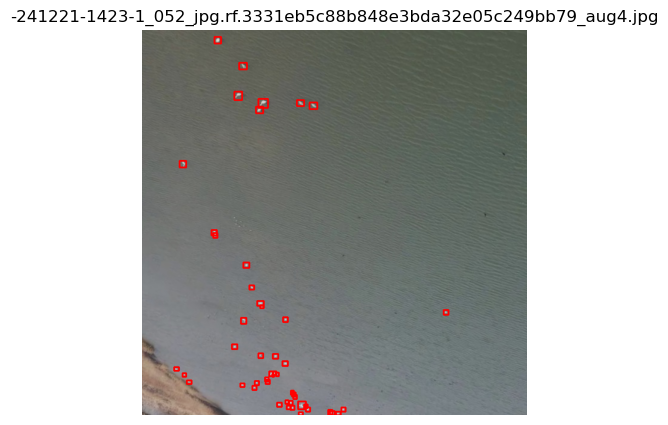

Labels for -250108-0934-1_079_jpg.rf.e3a8f9b67945c07287530ab94924bd79_aug4.jpg:
0.0 0.016857370734214783 0.9559880122542381 0.021262317895889282 0.02319822460412979

0.0 0.003617718815803528 0.9269274678081274 0.007235437631607056 0.023292873054742813

0.0 0.04008668661117554 0.8289011437445879 0.018158555030822754 0.018638502806425095

0.0 0.9971292018890381 0.6404830850660801 0.005741596221923828 0.022006619721651077

0.0 0.7461045384407043 0.3651309022679925 0.020708084106445312 0.017958713695406914

0.0 0.8112731873989105 0.280165649484843 0.01645427942276001 0.014754270203411579

0.0 0.8576842546463013 0.29342356137931347 0.015560388565063477 0.015812527388334274

0.0 0.8355621993541718 0.294303510338068 0.02664738893508911 0.02110016718506813



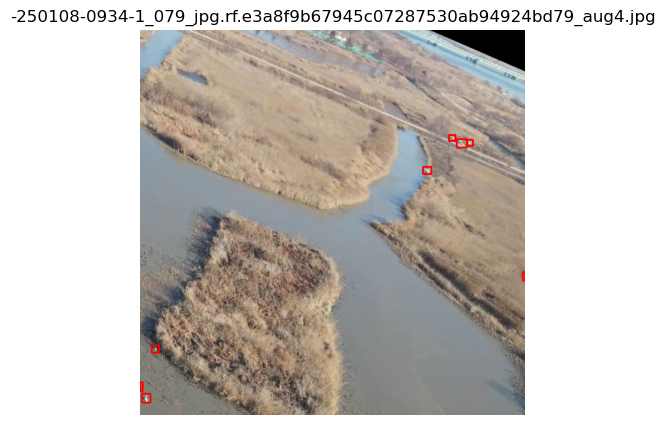

Labels for -241221-1423-1_132_jpg.rf.732030b00dfe8a305f767383588b8acf_aug6.jpg:
0.0 0.06526746929157526 0.7921403121203184 0.015162927098572254 0.020439910143613814

0.0 0.07702517148572952 0.8120149578899145 0.012824224634096026 0.017562230676412584

0.0 0.28121061688289045 0.831889520958066 0.011821965593844653 0.017497888952493667

0.0 0.585394287109375 0.8788590207695961 0.013659428246319294 0.023317672312259674

0.0 0.5004690647358074 0.773473272845149 0.01913350815884769 0.018975432962179184

0.0 0.5414218352874741 0.7879263427108526 0.018272643303498627 0.012924333661794662

0.0 0.07521333331242204 0.7204784765839577 0.013338258303701878 0.013386882841587067

0.0 0.14025969502981753 0.7144530974328518 0.01710325530730188 0.014581587910652161

0.0 0.3950610601576045 0.7584163170307875 0.021497871866449712 0.014697287231683731

0.0 0.25711698895320295 0.7343277845531702 0.016190994437783955 0.012192095071077347

0.0 0.441436477843672 0.7343277845531702 0.018979320116341115 0.01307

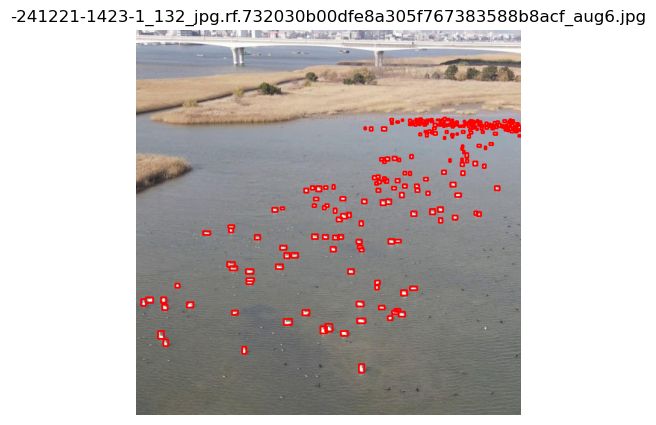

Labels for -250206-1435-1_030_jpg.rf.748d75509ecfbb8e0b4f96f574ee7304_aug8.jpg:



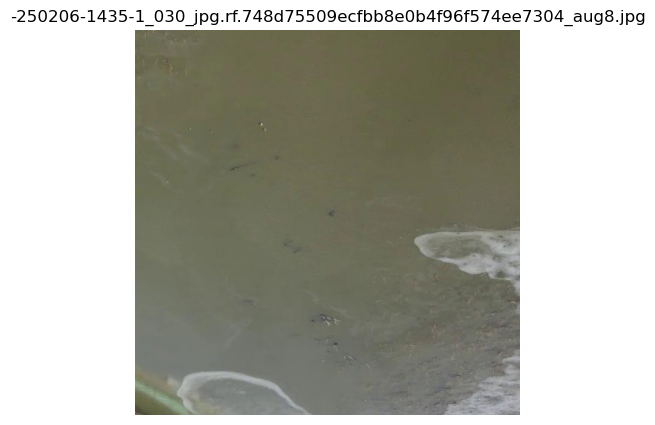

Labels for -250108-0934-1_044_jpg.rf.ae806b9c1ab53570f89b54408e38fa7a_aug9.jpg:
0.0 0.8669988890178502 0.03150257985107596 0.028616930544376373 0.015227952506393194

0.0 0.9101373156066984 0.01730728754773736 0.013636501599103212 0.01716221850365396

0.0 0.9284941158257425 0.028781565325334657 0.01663581356406212 0.013605283666402124



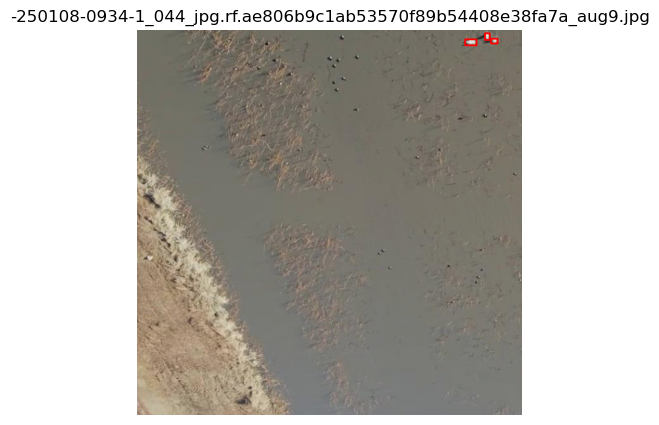

Labels for -241221-1423-1_006_jpg.rf.31018b5377a5d758279272f0c285ba6d_aug2.jpg:



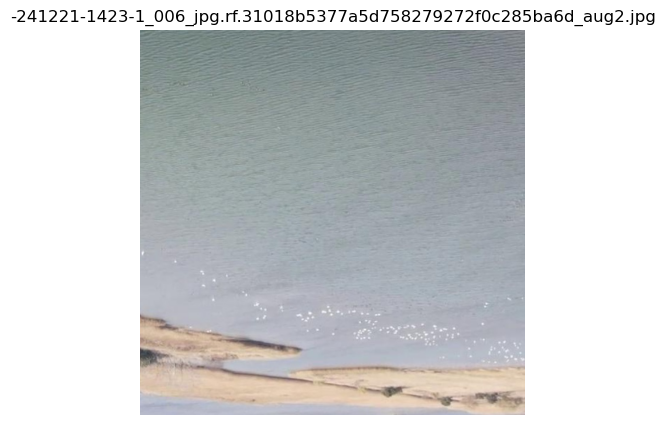

Labels for -250206-1036-1_013_jpg.rf.e8f02755824454f75d56c220d0f634da_aug6.jpg:
0.0 0.7692848939215764 0.3365327332401648 0.007869494752958417 0.0074550064746290445

0.0 0.7764184874249622 0.3388658381998539 0.01596449506469071 0.01422865316271782

0.0 0.7855362268630415 0.3370424148859456 0.0088315075263381 0.008376267971470952

0.0 0.8115704757161438 0.31853565243072807 0.009768848866224289 0.008430331014096737

0.0 0.8177719218656421 0.31770037598907946 0.010321315843611956 0.007818849291652441

0.0 0.8668966847239062 0.291340895765461 0.006223174324259162 0.007158073363825679

0.0 0.8804090557154268 0.29829673150088637 0.0056758147664368154 0.0053269371856004

0.0 0.8804635925684124 0.2938898392720148 0.007684156019240618 0.006748245330527425

0.0 0.8983075314667076 0.2865667300764471 0.008493725303560495 0.00879305461421609

0.0 0.8699778005015105 0.2632575538707897 0.009466732013970613 0.008256755070760846

0.0 0.9095478365663439 0.24618000707123427 0.010064559802412987 0.0112857

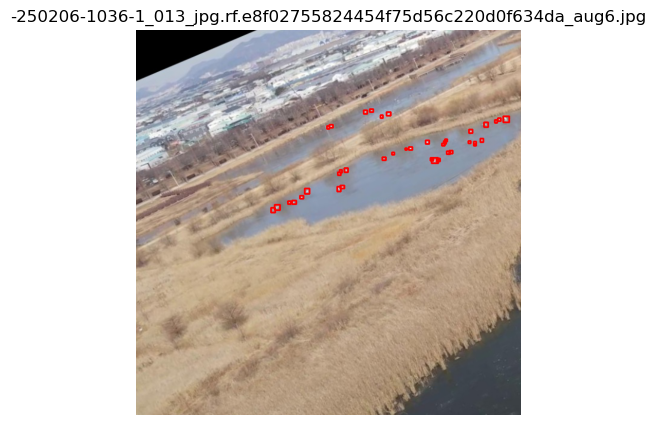

Labels for -250206-1036-1_034_jpg.rf.72e921110d89102bc64ddc1a30911674_aug6.jpg:
0.0 0.2191387176513672 0.5844450186938047 0.011520445346832275 0.012142863124608994

0.0 0.2033417135477066 0.5878731835633516 0.023739606142044067 0.020429279655218124

0.0 0.4324369192123413 0.6852570850402117 0.018340229988098145 0.012978505343198776

0.0 0.44740471839904783 0.6755877550691366 0.015587568283081055 0.01240437850356102

0.0 0.4568743914365768 0.6825671479105949 0.01858922839164734 0.011133916676044464

0.0 0.46402364075183866 0.6717479046434164 0.019872218370437622 0.014892596751451492

0.0 0.5056563079357147 0.7783439619466662 0.022668957710266113 0.013572698459029198

0.0 0.4943418562412262 0.7680119419470429 0.014764130115509033 0.01200551725924015

0.0 0.4598428815603256 0.7471006693318486 0.015485554933547974 0.01026543416082859

0.0 0.4633022606372833 0.7206019446253776 0.016317307949066162 0.013304091989994049

0.0 0.5024197310209274 0.7352334786206484 0.018302053213119507 0.0108610

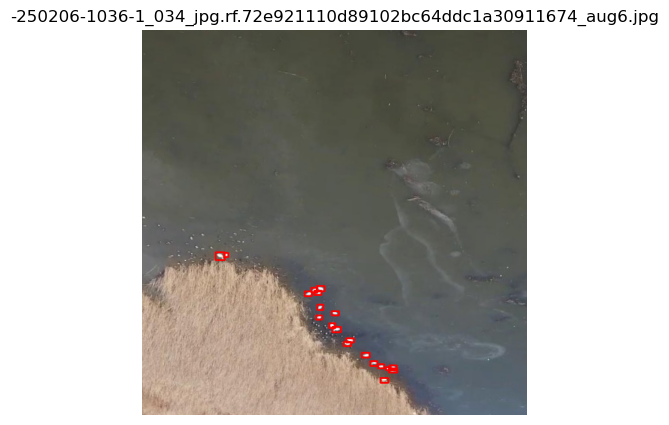

Labels for -250206-1036-1_006_jpg.rf.881cf011f062777dc79fc8f2adc42674_aug1.jpg:
0.0 0.9513593465089798 0.9345625277608633 0.00581243634223938 0.006015658378601074

0.0 0.9176094233989716 0.9370781045407057 0.007046878337860107 0.008031237870454788

0.0 0.8964999914169312 0.9330781262367964 0.006296932697296143 0.007124986499547958

0.0 0.9613593816757202 0.9321093626320363 0.006796896457672119 0.006796885281801224

0.0 0.619921863079071 0.9309062410145998 0.01235935091972351 0.007671855390071869

0.0 0.6142031252384186 0.9281874869018794 0.009312540292739868 0.007546830922365189

0.0 0.6489375084638596 0.9302187573164702 0.007234364748001099 0.006015658378601074

0.0 0.6582968533039093 0.9248906580731273 0.006437480449676514 0.0052343811839818954

0.0 0.6889062225818634 0.9310624964535237 0.0063437819480896 0.006718732416629791

0.0 0.6905624866485596 0.9360625196248293 0.010265707969665527 0.007046833634376526

0.0 0.7717031091451645 0.9140156416222454 0.00812503695487976 0.0096718948

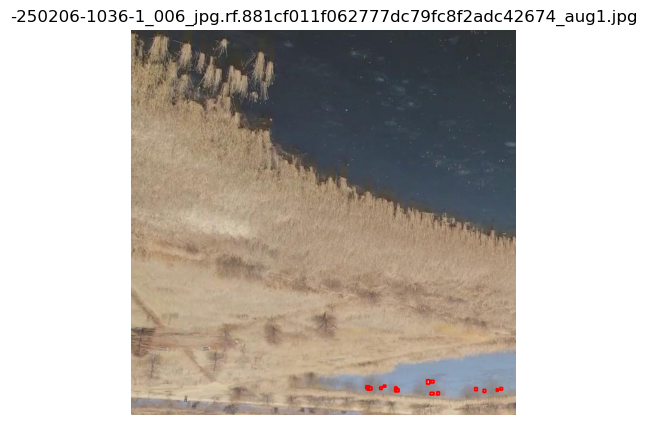

Labels for -250206-1435-1_093_jpg.rf.688844893e08410037f2195e481c16fc_aug2.jpg:
0.0 0.4525503021664917 0.3823504544794559 0.012604891881346702 0.009967328608036086

0.0 0.4032962034922093 0.3508809403050691 0.009081926848739385 0.007341608125716492

0.0 0.5397796920500696 0.3867312763351947 0.011211740598082543 0.011641989182680801

0.0 0.5848277017474175 0.3851906118914485 0.009376637823879718 0.008587481081485748

0.0 0.6110286571551115 0.4031158014666289 0.011546615045517683 0.007676479872316078

0.0 0.6598139392677694 0.4262255956418812 0.010448251385241747 0.007421941123902797

0.0 0.6731287818402052 0.42231368478387593 0.007072603516280651 0.007877463288605214

0.0 0.6872606904711575 0.41213196236640215 0.007755765784531831 0.008024762012064457

0.0 0.7226105629466474 0.3951981716789305 0.01226994078606367 0.011240065470337868

0.0 0.7527765115257352 0.502749201329425 0.01194855635985732 0.009404652658849955

0.0 0.8824552807956934 0.4596242875792086 0.008425591327250005 0.011092

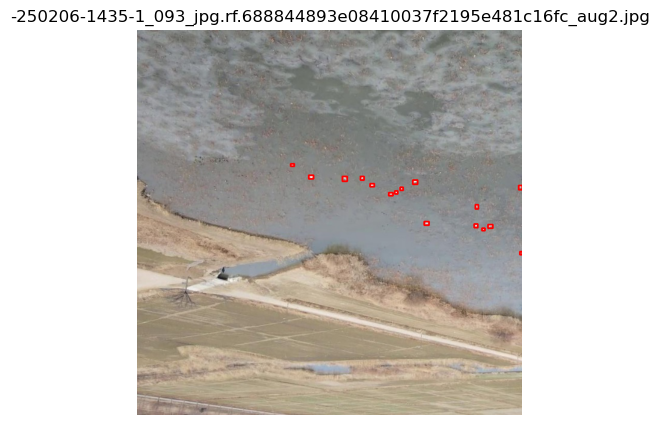

Labels for -250206-1036-1_027_jpg.rf.16d2baad91695abaac5e4e147d0b1326_aug4.jpg:
0.0 0.2097454912029207 0.47120802383869886 0.02300944272428751 0.013259789161384105

0.0 0.21398939918726684 0.47992064254358413 0.017062488943338394 0.013193792011588813

0.0 0.1803596241399646 0.49297033525072037 0.019671736285090446 0.01423404859378934

0.0 0.25433064652606846 0.4593887578928843 0.02117286901921034 0.015323664853349328

0.0 0.27486574538052083 0.4481429872801527 0.017378082498908043 0.012991433916613459

0.0 0.29165066527202727 0.4457515855319798 0.016191364265978336 0.01105800485238433

0.0 0.31686896812170745 0.44635736087802796 0.023659298196434975 0.016789420647546648

0.0 0.16790429018437864 0.49765837148297576 0.015463298186659813 0.014641915401443838

0.0 0.17093986393883825 0.520335052954033 0.01722893211990595 0.011760205682367086

0.0 0.13601018143817784 0.5054885684978216 0.017142861150205135 0.013472483493387699

0.0 0.13606038950383664 0.5236469601746648 0.013931313529610634

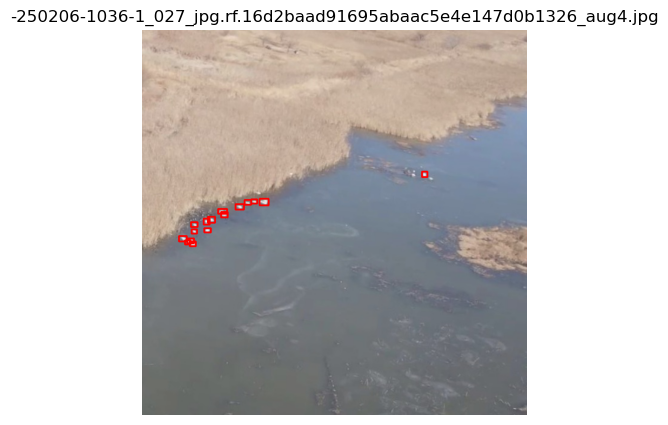

Labels for -241221-1423-1_216_jpg.rf.d5e37c1ee60210c145afb67bf9ae15b6_aug0.jpg:
0.0 0.6729102511424572 0.8556940164417028 0.03645539218559861 0.035564535111188886

0.0 0.7800825387239456 0.9283131368458271 0.037117315270006654 0.027297301590442656

0.0 0.636300525907427 0.7665477003902197 0.02806172166019678 0.03498126193881035

0.0 0.7932455255649984 0.900921355932951 0.03890997301787138 0.027841924130916594

0.0 0.954803166165948 0.7357418291270733 0.02213443033397198 0.02840782403945923

0.0 0.8209599761758 0.7523761924356223 0.03161563267931342 0.03359725698828697

0.0 0.6348294604104012 0.5539858173578978 0.024522385094314814 0.021920276433229448

0.0 0.521963419765234 0.5603977229446173 0.020755756460130215 0.023016353696584703

0.0 0.1493853938765824 0.5622239409014582 0.02060393923893571 0.022444939240813255

0.0 0.1870224011829123 0.594913762062788 0.020487256860360504 0.022876879572868346

0.0 0.3776443209964782 0.5389484278857708 0.028396413568407296 0.02307257279753685

0.0

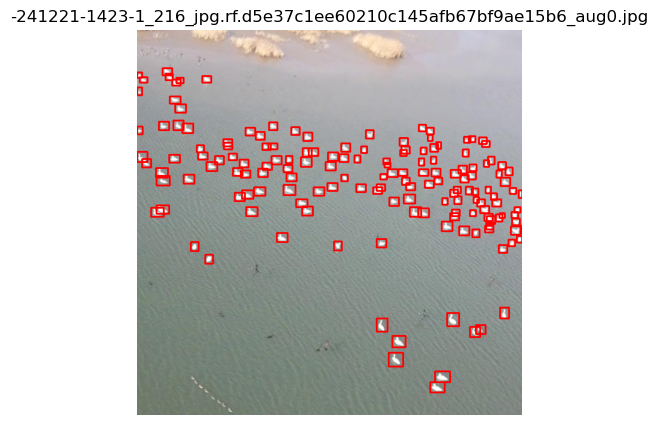

Labels for -250206-1435-1_030_jpg.rf.748d75509ecfbb8e0b4f96f574ee7304_aug9.jpg:



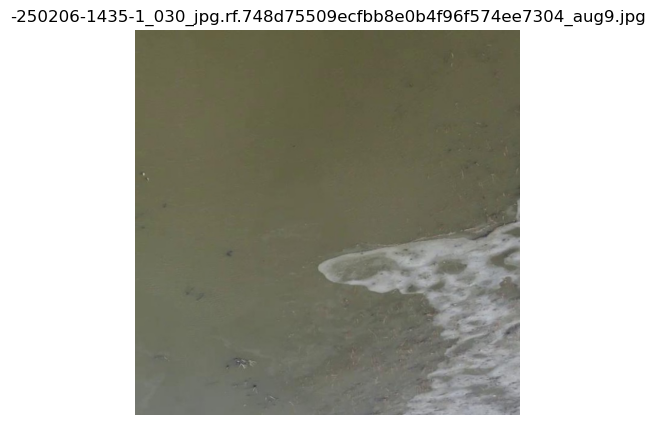

Labels for -250206-1036-1_048_jpg.rf.bff29800b2636d6167654ef65e2afc8a_aug6.jpg:
0.0 0.004175758361816407 0.19820314198732375 0.008351516723632813 0.014671918004751205

0.0 0.06220312118530273 0.20509374532848595 0.0094374418258667 0.010046867653727531

0.0 0.08153120875358581 0.2111250191926956 0.013796746730804443 0.017921850085258484

0.0 0.10271878242492676 0.24237500056624411 0.013843774795532227 0.013656232506036758

0.0 0.10826568007469177 0.23256249092519282 0.013671934604644775 0.011437475681304932

0.0 0.11171875596046447 0.22420312669128178 0.017703115940093994 0.012406239286065102



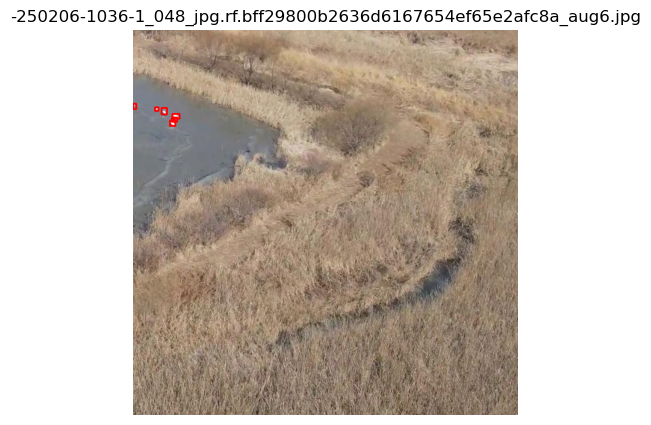

Labels for -250206-1036-1_048_jpg.rf.bff29800b2636d6167654ef65e2afc8a_aug7.jpg:
0.0 0.9934832506347447 0.8946735918521881 0.013033498730510473 0.013407409191131592

0.0 0.7096266345353797 0.9662847280502319 0.017384522361680865 0.012537002563476562

0.0 0.7018137642182409 0.942099517583847 0.020457888022065163 0.012000024318695068

0.0 0.7214941736776381 0.9370995223522186 0.02068014582619071 0.011055529117584229

0.0 0.7181800640420988 0.9498402833938598 0.01295970636419952 0.010907411575317383

0.0 0.8325041074305772 0.9599328696727752 0.013052402064204216 0.009407341480255127

0.0 0.8416870201937854 0.9486921489238739 0.02034686505794525 0.01122218370437622



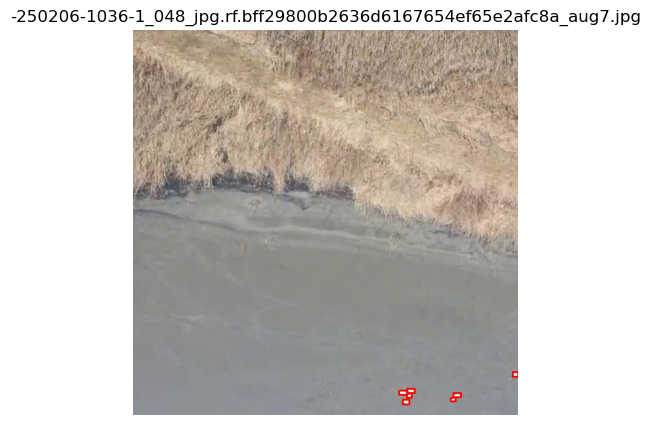

Labels for -250206-1435-1_058_jpg.rf.4d501ddc275e7552f3dda7d479f3b1d4_aug3.jpg:
0.0 0.8802166998386383 0.29857584871351717 0.020057380199432373 0.014147680252790451

0.0 0.9303735613822937 0.2874739173799753 0.023747563362121582 0.01636764407157898

0.0 0.957526010274887 0.2909794807434082 0.022297203540802002 0.014773305505514145

0.0 0.3474277973175049 0.5367947336286306 0.014160454273223877 0.013478200882673264

0.0 0.22405945956707002 0.4115889150649309 0.010594099760055542 0.011055361479520798

0.0 0.22751883864402772 0.43028947748243807 0.01725250482559204 0.015878308564424515

0.0 0.038265925645828244 0.31483549196273086 0.01206350326538086 0.010103194043040276

0.0 0.06870135366916656 0.3062582653015852 0.011860281229019165 0.010783988982439041

0.0 0.08416388630867004 0.30162775833159683 0.01287996768951416 0.011515377089381218

0.0 0.09492455124855041 0.31692193206399677 0.011991798877716064 0.010194825008511543

0.0 0.06851046979427337 0.31823908947408197 0.01641359925270080

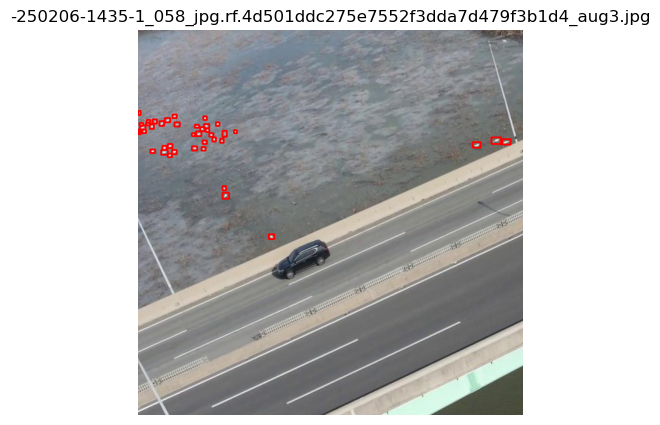

Labels for -250206-1435-1_072_jpg.rf.04229fc3ae161507331496dd55c04d7c_aug7.jpg:
0.0 0.8043930632993579 0.2768830673303455 0.028932341560721397 0.017519987467676402

0.0 0.7707412844523788 0.29366236687637864 0.02517157606780529 0.01715843742713332

0.0 0.671080288104713 0.27169105685316025 0.016060373559594155 0.015873325895518063

0.0 0.6487104947678745 0.20188112030737101 0.02024823222309351 0.02158817490562792



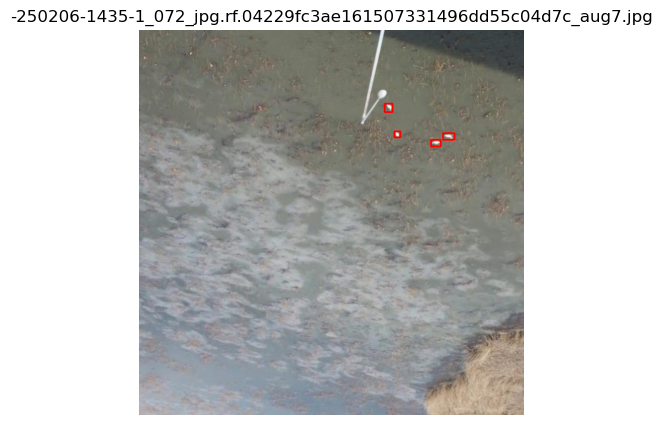

Labels for -250108-0934-1_009_jpg.rf.82161c4c665635f95eb4193ddc5f56d7_aug2.jpg:
0.0 0.0552115760743618 0.03736417478648946 0.018857671320438384 0.022785811848007143

0.0 0.014162600785493851 0.016081087838392703 0.017109131813049315 0.0225244706729427

0.0 0.03199078440666199 0.01194025658769533 0.015344509482383728 0.02388051317539066



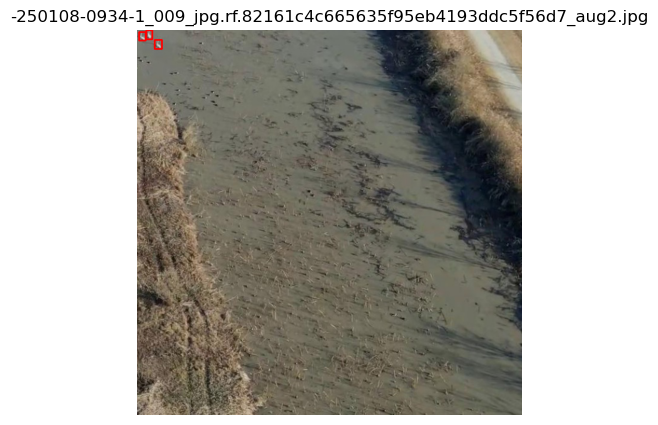

Labels for -250206-1036-1_006_jpg.rf.9470db5f59e0a25d30b8a2644757d8a2_aug3.jpg:
0.0 0.9528240621089935 0.0005018132738769055 0.010553240776062012 0.001003626547753811



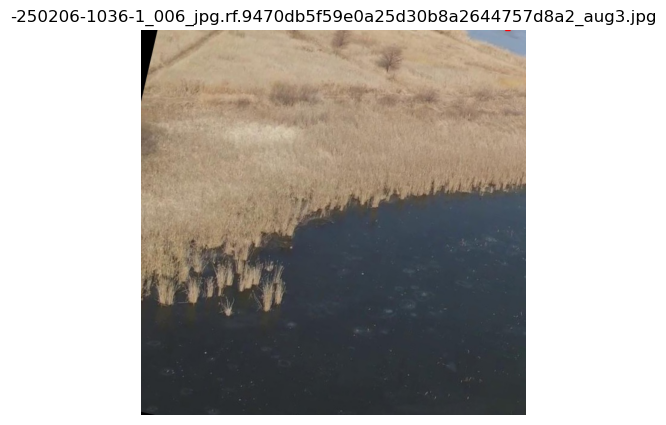

Labels for -250206-1435-1_029_jpg.rf.a5bfa9bf1ec7c727f1fb922133703ee7_aug4.jpg:
0.0 0.1643124520778656 0.10303126648068428 0.015421807765960693 0.0250469371676445

0.0 0.09243747591972351 0.0897656474262476 0.017390549182891846 0.024656374007463455

0.0 0.1921406388282776 0.13232813030481339 0.018078088760375977 0.0215313658118248

0.0 0.202390655875206 0.17398441210389137 0.018156319856643677 0.022296801209449768

0.0 0.2990781217813492 0.19823438115417957 0.02317187190055847 0.012890595942735672

0.0 0.162109375 0.2333125453442335 0.015249967575073242 0.01725005730986595

0.0 0.3400937467813492 0.30225001089274883 0.01843741536140442 0.0158437080681324

0.0 0.378171905875206 0.3117655999958515 0.015718728303909302 0.017874978482723236

0.0 0.3422812670469284 0.36084373854100704 0.013562589883804321 0.01725005730986595

0.0 0.4689999967813492 0.3344687055796385 0.029140502214431763 0.020468708127737045



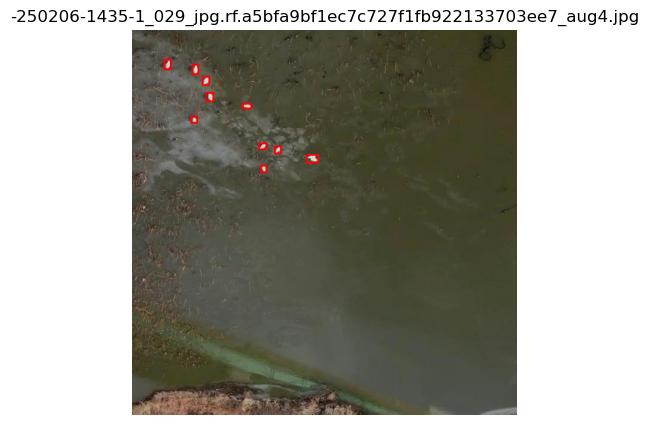

Labels for -250108-0934-1_037_jpg.rf.a8f86afc15071c8419da0ce86c03c75a_aug8.jpg:



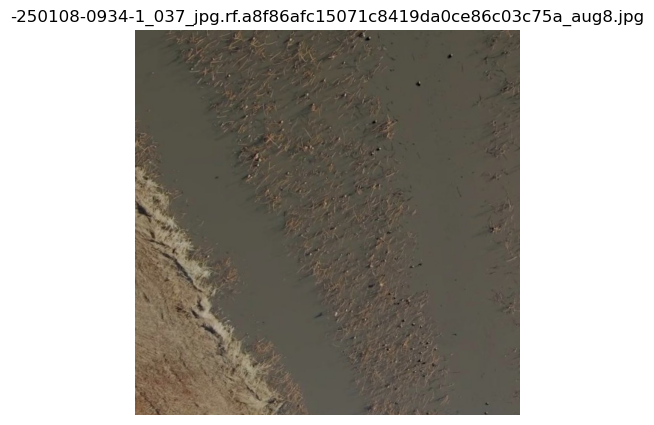

Labels for -250108-0934-1_026_jpg.rf.4f97c52f4116ffe07aa7314376086ea9_aug2.jpg:



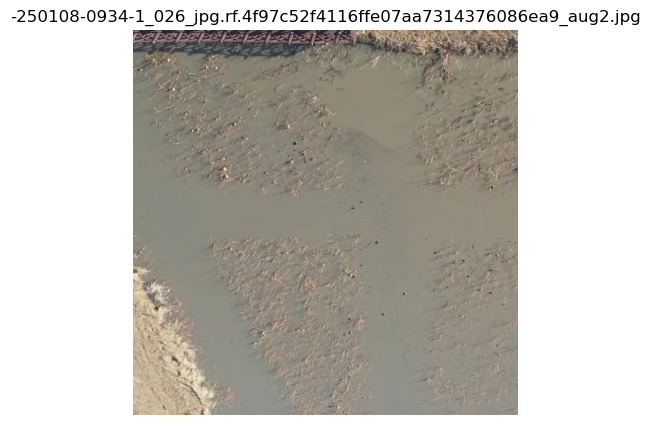

Labels for -241221-1423-1_216_jpg.rf.d5e37c1ee60210c145afb67bf9ae15b6_aug6.jpg:
0.0 0.7844542056322098 0.7105588939040899 0.019836634397506714 0.02202029898762703

0.0 0.8261288940906525 0.6805148001760244 0.019664347171783447 0.02249927446246147

0.0 0.9290490537881851 0.8174772689118981 0.03098943829536438 0.022012604400515556

0.0 0.26040353775024416 0.9354823620989918 0.0326002836227417 0.02321487106382847

0.0 0.14665986001491546 0.9437789123505353 0.027456164360046387 0.019973337650299072

0.0 0.17228711545467376 0.9416181918233633 0.03599345684051514 0.02312198281288147

0.0 0.33127143383026125 0.9145883394405245 0.026496291160583496 0.017506694421172142

0.0 0.4003790408372879 0.9327364757657051 0.01658955216407776 0.015619207173585892

0.0 0.9489724576473236 0.9232894087210297 0.025109946727752686 0.021904779598116875

0.0 0.9452200919389725 0.873047199845314 0.029245108366012573 0.020817328244447708

0.0 0.811816492676735 0.9276933779940009 0.02733251452445984 0.0216117817908

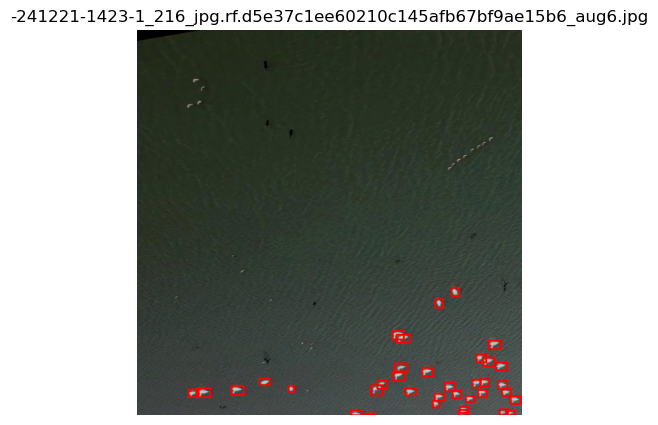

Labels for -250108-0934-1_030_jpg.rf.317b2a92e7c47b5e5b5bd9280611e3e3_aug5.jpg:
0.0 0.03860102416947484 0.5302125388989225 0.025555101223289967 0.019470998039469122

0.0 0.028430109936743976 0.4583625835250132 0.024645778350532055 0.021926715900190175

0.0 0.07088898411020636 0.44924766313051806 0.03226531948894262 0.022088726772926746

0.0 0.2034657067619264 0.5127396170748397 0.018517625518143177 0.025097099086269736

0.0 0.24851969126611947 0.5560747182695195 0.02012612670660019 0.02314764349721372

0.0 0.3086710494011641 0.5499050212558358 0.027136022225022316 0.02093847272917628

0.0 0.3128555194474757 0.5159447003388777 0.024025018326938152 0.018839277187362315

0.0 0.6277046535164118 0.48820538856089113 0.06158655695617199 0.047394460439682005

0.0 0.30948034264147284 0.40770701033761725 0.024720903486013412 0.024559233407489955

0.0 0.21347072822973132 0.39241566418204454 0.019778904505074024 0.022561822831630707

0.0 0.15027741957455873 0.3760533474385738 0.019094545394182205 

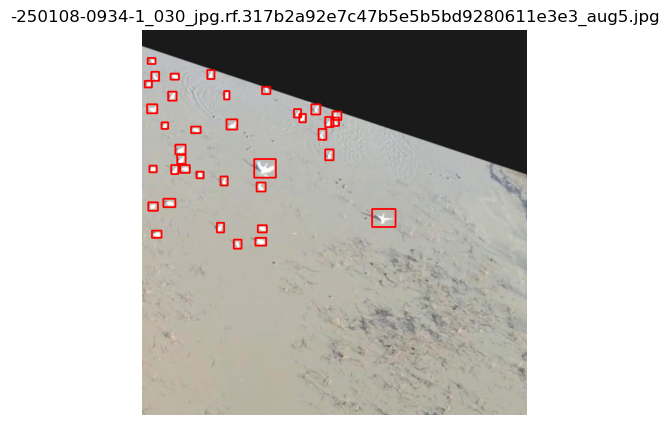

Labels for -250108-0934-1_058_jpg.rf.3530f8c55b4064a25d4f744ceb73f27d_aug7.jpg:
0.0 0.9083281517028808 0.92178127579391 0.01060938835144043 0.02310940995812416

0.0 0.8573592960834503 0.8977343834936619 0.012562572956085205 0.025328166782855988

0.0 0.7018124520778656 0.9587031234055757 0.014249861240386963 0.02806251123547554

0.0 0.6652969479560852 0.951250035688281 0.014484286308288574 0.02629688009619713

0.0 0.738343870639801 0.928359343111515 0.019484281539916992 0.02751564234495163

0.0 0.4866873979568481 0.9876484639942646 0.01490628719329834 0.024703072011470796

0.0 0.43823436498641966 0.9551249895244837 0.014234304428100586 0.02745318040251732

0.0 0.7845781803131103 0.9024843577295542 0.022281289100646973 0.02170306071639061

0.0 0.8563125193119049 0.8658125087618828 0.024671852588653564 0.020546860992908478

0.0 0.7610155999660492 0.8902031429111957 0.022187769412994385 0.01790636032819748

0.0 0.7099374890327453 0.8310468554496765 0.014093756675720215 0.024296991527080536

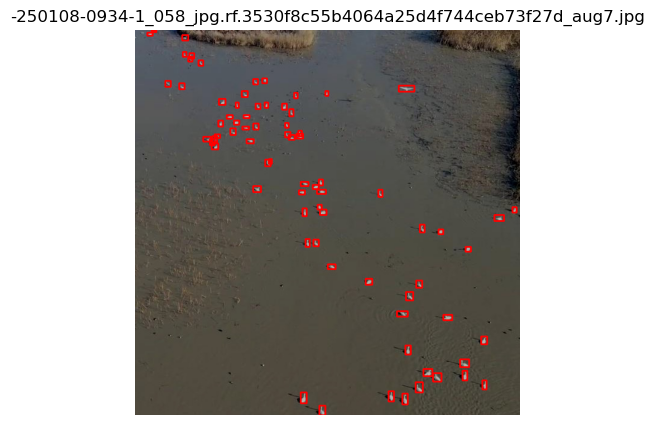

Labels for -250206-1435-1_008_jpg.rf.db2bd80d9f4d803ef16c2e802911ebdd_aug3.jpg:
0.0 0.1541213184595108 0.42439041659235954 0.0157911479473114 0.013768382370471954

0.0 0.1557086944580078 0.40780551359057426 0.01702737808227539 0.01421094685792923

0.0 0.11299165487289428 0.4346394054591656 0.015412688255310059 0.016688503324985504

0.0 0.08751339614391326 0.4399171629920602 0.022239357233047485 0.01640440709888935



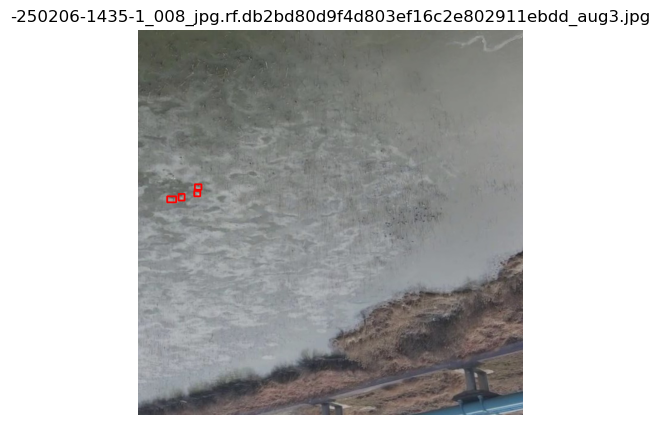

Labels for -250206-1435-1_008_jpg.rf.db2bd80d9f4d803ef16c2e802911ebdd_aug0.jpg:
0.0 0.48326021861284973 0.5658866697456688 0.014176283031702042 0.009710282925516367

0.0 0.5130037074908614 0.5592138822656125 0.014297906309366226 0.010768282879143953

0.0 0.4662488259840757 0.5159971085842698 0.014958336483687162 0.010635367501527071

0.0 0.6073544352315366 0.5920070013497025 0.014496189542114735 0.011638604383915663

0.0 0.595387844927609 0.5776933540124446 0.017769906669855118 0.01179353790357709

0.0 0.6614045082591474 0.6244340184144676 0.014660983346402645 0.0116821164265275

0.0 0.5331054321490228 0.5490626517683268 0.012387431226670742 0.009111800789833069

0.0 0.7226226456463337 0.5006351395975799 0.0127997025847435 0.008102797251194716

0.0 0.5488784868270159 0.5361820588354022 0.011794732883572578 0.01357603957876563

0.0 0.7378520528785885 0.48249620301648977 0.010637949220836163 0.01013915278017521

0.0 0.5548777199350298 0.5514876920264214 0.013809620402753353 0.00929968087

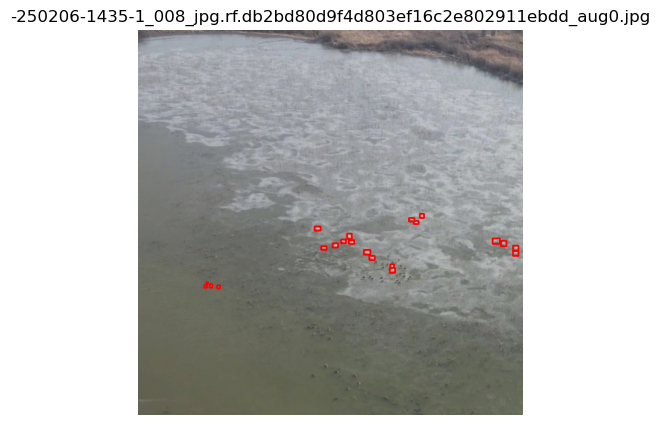

Labels for -250206-1036-1_027_jpg.rf.16d2baad91695abaac5e4e147d0b1326_aug5.jpg:



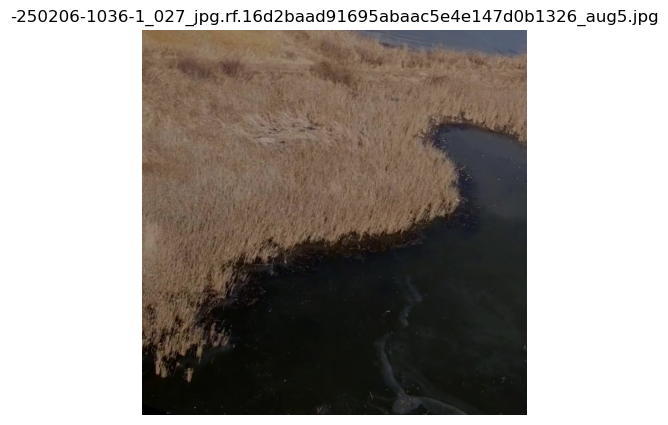

Labels for -250108-0934-1_030_jpg.rf.317b2a92e7c47b5e5b5bd9280611e3e3_aug6.jpg:
0.0 0.9954327940940857 0.9697849109768868 0.009134411811828613 0.02886807918548584

0.0 0.9875495731830597 0.9950498636811972 0.02458101511001587 0.009900272637605668

0.0 0.958508312702179 0.987941624224186 0.024190306663513184 0.024116751551628113

0.0 0.6963526010513306 0.09669964965432883 0.02144908905029297 0.01486046053469181

0.0 0.6796327829360962 0.03590677883476019 0.02024996280670166 0.01730683632194996

0.0 0.7152100503444672 0.023350884858518838 0.02742666006088257 0.016404985450208187

0.0 0.8364810347557068 0.06338886423036456 0.014020800590515137 0.021151087246835232

0.0 0.8801020681858063 0.09574612434953451 0.01581054925918579 0.01908624731004238

0.0 0.9312509894371033 0.08376954980194569 0.022739768028259277 0.016028176993131638

0.0 0.9310964047908783 0.054039903171360495 0.020090997219085693 0.014475379139184952



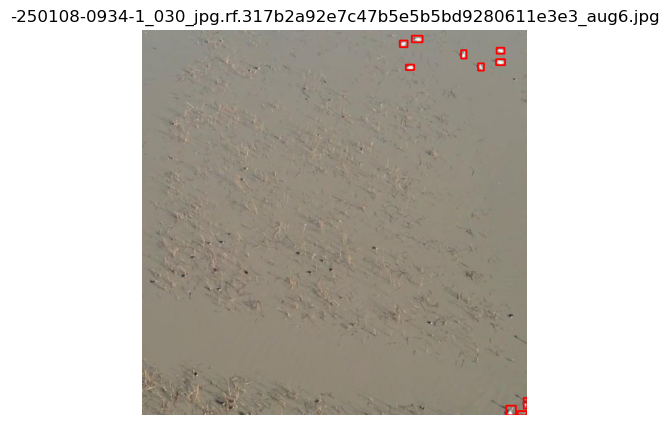

Labels for -250108-0934-1_023_jpg.rf.6b3de9060f02edc64eefbc2d4da35115_aug6.jpg:
0.0 0.5759996712207794 0.4724507361650467 0.031155645847320557 0.03693794086575508

0.0 0.5461743116378784 0.5082401467487216 0.033907413482666016 0.03619387932121754

0.0 0.5126883625984192 0.4983156381174922 0.021459460258483887 0.024284368380904198

0.0 0.4929493606090546 0.4761460993438959 0.035973966121673584 0.03720005974173546

0.0 0.49558123350143435 0.5855951637029648 0.025682687759399414 0.025285016745328903

0.0 0.538641506433487 0.6722715945914388 0.024647533893585205 0.0247634444385767

0.0 0.4729608237743378 0.5138330303132534 0.025505125522613525 0.025339633226394653

0.0 0.44936909675598147 0.5524527665227652 0.02123701572418213 0.025039594620466232

0.0 0.4456260740756989 0.6114218441769481 0.023164808750152588 0.02507846988737583

0.0 0.40983941555023196 0.5773886350914836 0.022202253341674805 0.02520108036696911

0.0 0.3409036934375763 0.5591678779572249 0.029118239879608154 0.03321889042

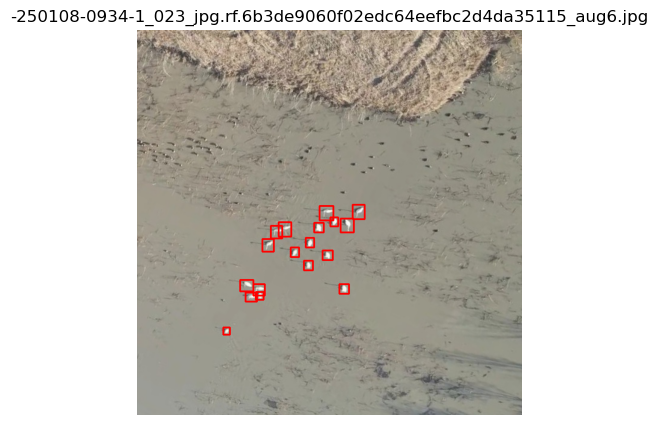

Labels for -241221-1423-1_094_jpg.rf.494dfc602125577f25bf3c3f2c759127_aug9.jpg:
0.0 0.24581834618002177 0.9771768471691757 0.021866803988814354 0.016068989131599664

0.0 0.25923316422849896 0.9530507205985487 0.015565398707985878 0.015332321636378765

0.0 0.42305369544774296 0.8404322297312319 0.010527269169688224 0.011800033412873745

0.0 0.18209791742265224 0.743356716632843 0.011083781719207764 0.019180642440915108

0.0 0.14842537995427846 0.5419603096786887 0.009985988214612006 0.009409855585545301

0.0 0.19345233961939812 0.5722644571214914 0.007880499958992005 0.009530133754014968

0.0 0.3337367013096809 0.5582547598984092 0.011910934746265412 0.010311893466860057

0.0 0.37805685475468637 0.5276349185500294 0.01558045819401741 0.013844181690365076

0.0 0.1376574171707034 0.3473882857011631 0.011519818380475045 0.010371935786679387

0.0 0.1895722845569253 0.3980004294076934 0.013083939626812934 0.010852951696142555

0.0 0.18964749593287705 0.35831642334815117 0.010361872985959053 

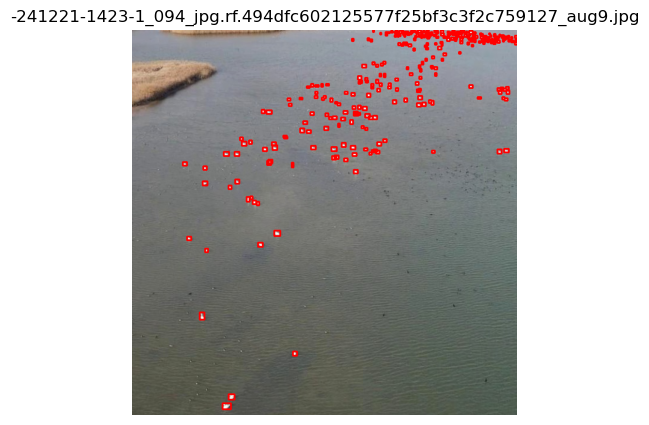

Labels for -250108-0934-1_086_jpg.rf.0479792424088eb13f1af0f565901aa2_aug1.jpg:



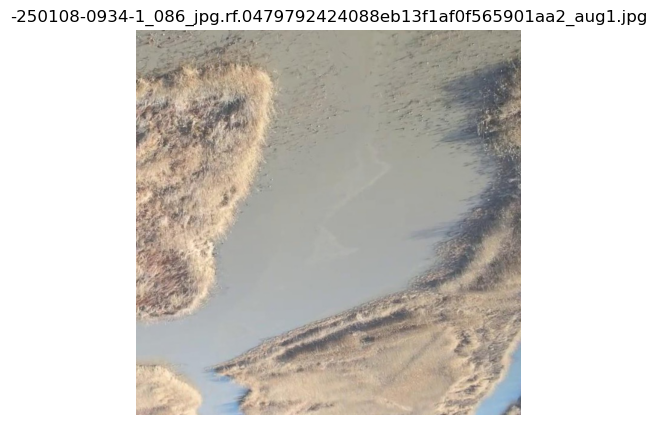

Labels for -241221-1423-1_132_jpg.rf.732030b00dfe8a305f767383588b8acf_aug4.jpg:
0.0 0.25487797558307645 0.017502611503005028 0.02984645962715149 0.024433080106973648

0.0 0.36471367478370664 0.08751269243657589 0.024448692798614502 0.021486405283212662

0.0 0.25393365919589994 0.14873223565518856 0.019260138273239136 0.019317034631967545

0.0 0.3351182699203491 0.0619001779705286 0.01838850975036621 0.018729429692029953

0.0 0.23023044168949128 0.0650933813303709 0.02728620171546936 0.023869413882493973

0.0 0.29780753552913664 0.08163483254611492 0.02190658450126648 0.018952321261167526

0.0 0.16297275424003602 0.14769683592021465 0.02366691827774048 0.020891156047582626

0.0 0.3439804673194885 0.15187479555606842 0.025013208389282227 0.023860864341259003

0.0 0.36553228497505186 0.17769400775432587 0.026413142681121826 0.020488321781158447

0.0 0.08420932888984681 0.18937175069004297 0.022052764892578125 0.020737918093800545

0.0 0.01480623185634613 0.20397295895963907 0.023055106401

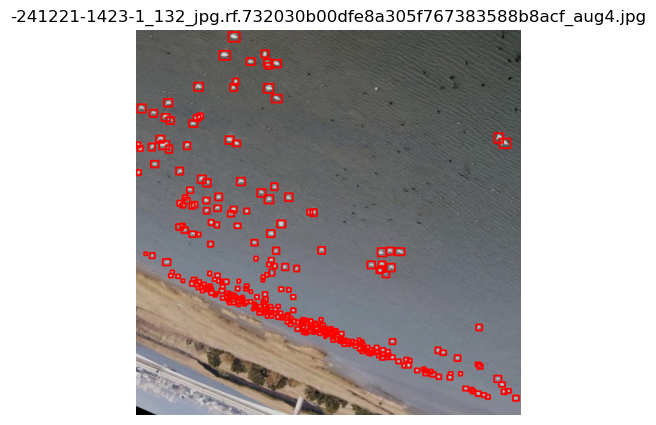

Labels for -250206-1036-1_097_jpg.rf.d2ae3038829d546c04c3288d83cc6a05_aug5.jpg:
0.0 0.303792205452919 0.6185464978218078 0.019454509019851685 0.011918362230062485

0.0 0.32793441116809846 0.6177928306162357 0.016742795705795288 0.014648783951997757

0.0 0.3410410702228546 0.6075910402461886 0.02055037021636963 0.015614429488778114

0.0 0.39003774225711824 0.5249622639268636 0.020007222890853882 0.016912199556827545

0.0 0.32424664199352266 0.4702134158462286 0.021164506673812866 0.01773587241768837

0.0 0.6239637404680252 0.46240864023566247 0.02032962441444397 0.01889146864414215

0.0 0.834665161371231 0.4057882472872734 0.019646823406219482 0.012593775987625167



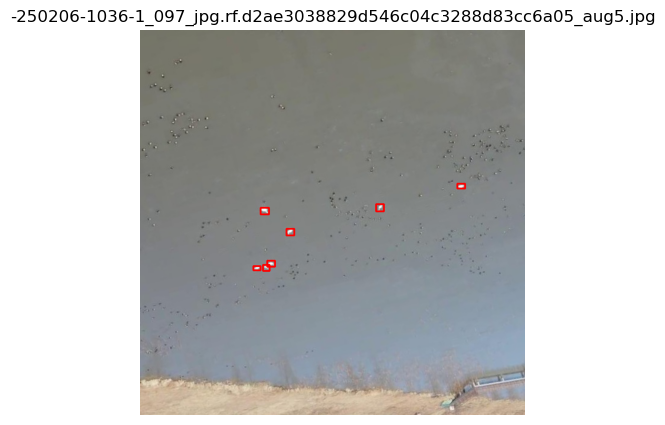

Labels for -250206-1435-1_093_jpg.rf.688844893e08410037f2195e481c16fc_aug7.jpg:
0.0 0.30918409107252953 0.3719004712998867 0.012390470877289773 0.009795106947422028

0.0 0.2607678506989032 0.40282623576931653 0.008927434775978326 0.007214755285531282

0.0 0.39492962742224336 0.3675953439902514 0.011021018400788308 0.011440831702202559

0.0 0.4392113283276558 0.36910938788205383 0.009217132441699505 0.008439101278781891

0.0 0.4649665809702128 0.3514939208049327 0.011350196320563555 0.007543840911239386

0.0 0.5129219797905534 0.3287834319286048 0.010270516853779554 0.007293700240552425

0.0 0.526010324433446 0.33262775037437675 0.006952291913330555 0.0077413516119122505

0.0 0.5399018360767514 0.34263354670256374 0.007623832952231169 0.007886105217039585

0.0 0.574650374148041 0.3592747448943555 0.012061217613518239 0.011045852676033974

0.0 0.6043031717184931 0.25358204836957154 0.011745300237089395 0.009242153260856867

0.0 0.7317759837955237 0.29596182322129605 0.00828226413577795 0

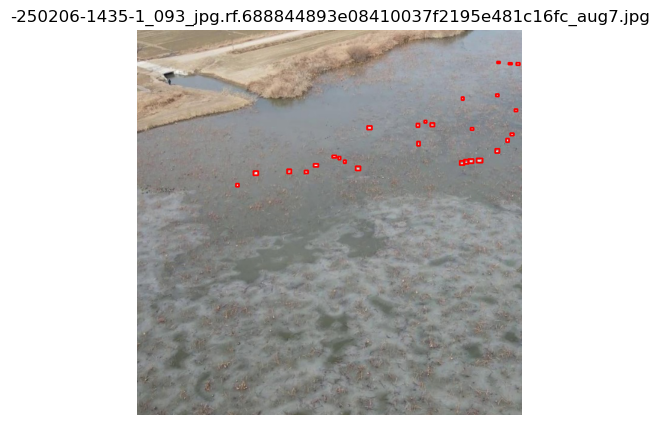

Labels for -250206-1435-1_037_jpg.rf.46aeca4b9bf7c1c84f9b8dcca7028bb7_aug1.jpg:
0.0 0.8753493934869766 0.0017978072166442982 0.04565790295600891 0.0035956144332885964



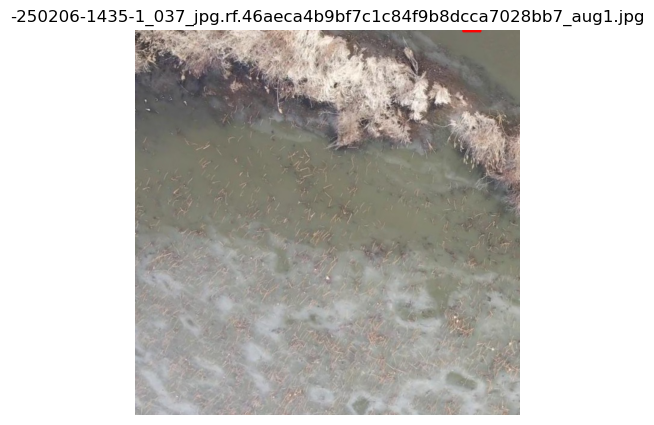

Labels for -250206-1036-1_041_jpg.rf.5e0255435f36cf6cb9a89a2927c657a7_aug5.jpg:
0.0 0.7437805118504912 0.0029823348857462295 0.018384935054928064 0.005964669771492459

0.0 0.78998419274576 0.02284293225966394 0.01826391788199544 0.014135659765452058

0.0 0.8081408384256065 0.03632150697521863 0.02222293019294739 0.014256354141980454

0.0 0.8569345632568002 0.0722910643555224 0.021954480931162833 0.014082046598196007

0.0 0.851298357360065 0.0867217692080885 0.020464802533388136 0.010715813096612736

0.0 0.9154171103145927 0.12069296268746255 0.02077364204451442 0.013626032508909702

0.0 0.9460272370371967 0.14640276422724124 0.021645641420036554 0.011386366188526176

0.0 0.9713902403600514 0.15364494482055308 0.01956577394157648 0.010769426263868787

0.0 0.9902984825428576 0.20105443838983778 0.01268146326765418 0.012593309953808807

0.0 0.9934214830864221 0.15800362625159325 0.013157033827155828 0.01241900241002436

0.0 0.9991147421300411 0.15521410121582452 0.0017705157399177552 0.01

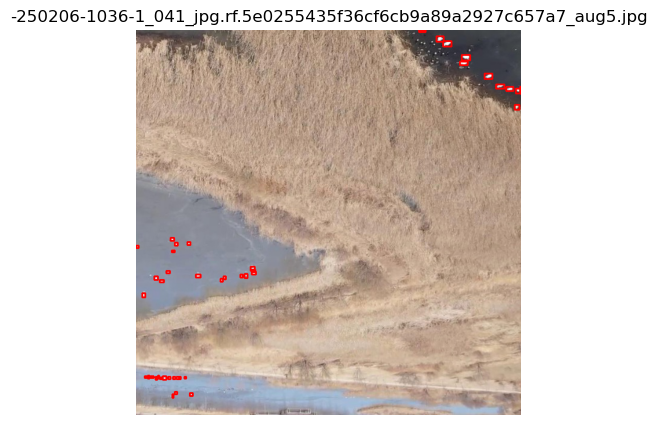

Labels for -250206-1036-1_111_jpg.rf.2f43e7a156d3cc85eb35c7a2c757fa55_aug1.jpg:



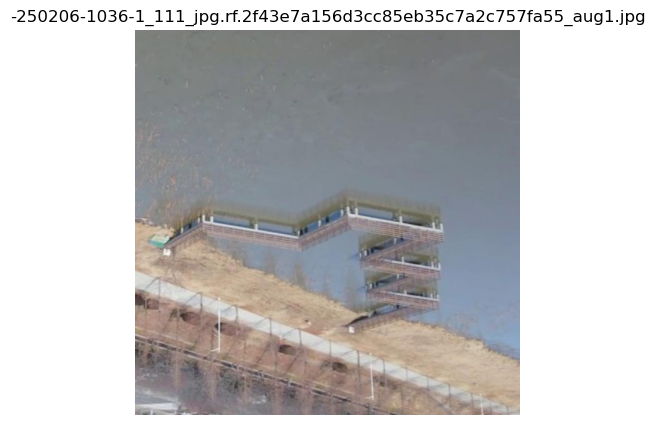

Labels for -241221-1423-1_017_jpg.rf.d8616daea9009a4212496fc17e0d97b7_aug9.jpg:
0.0 0.45800884515047074 0.3470181526616216 0.022028186917304994 0.017170798033475876

0.0 0.46715965420007705 0.27363511426374315 0.020850178599357606 0.020196167193353175

0.0 0.44206944331526754 0.24622722966596483 0.019544149935245513 0.022051139362156393

0.0 0.563874089717865 0.34112383155152204 0.016567301750183106 0.019796528108418032

0.0 0.5613572776317597 0.4289073819294572 0.01571151614189148 0.015731990709900855

0.0 0.5359823182225227 0.4984079772606492 0.01409345269203186 0.01438647396862507

0.0 0.5263504259288311 0.4292607311159372 0.01872279793024063 0.016781287640333174

0.0 0.47880899235606195 0.36206850018352266 0.016838742792606352 0.014549776911735535

0.0 0.47118680626153947 0.20760719422250987 0.02074213922023773 0.019243270531296687

0.0 0.42795419320464134 0.17194900149479508 0.020724369585514067 0.015383261628449052

0.0 0.42690499499440193 0.1895444937981665 0.019756753742694855 

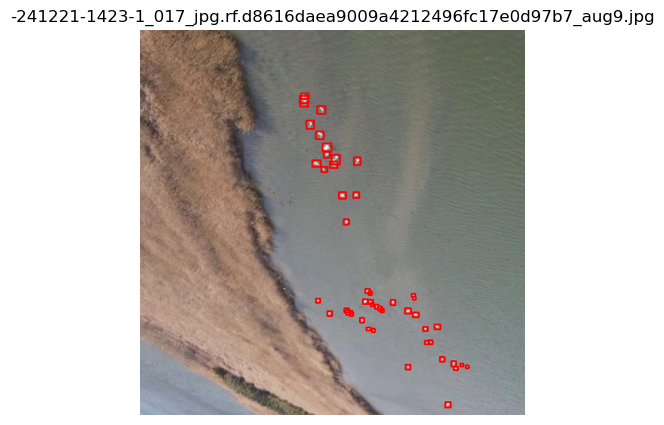

Labels for -250206-1036-1_020_jpg.rf.4cc2ce4d02374e956f357cc9b644d78a_aug0.jpg:
0.0 0.12404900193214416 0.4732196258381009 0.013391733169555664 0.012769946828484535

0.0 0.13640817403793334 0.47468411196023225 0.011619329452514648 0.011124009266495705

0.0 0.25322052240371706 0.5378078391775489 0.015119075775146484 0.012052388861775398

0.0 0.2658321797847748 0.5367721376940608 0.009640395641326904 0.008966004475951195

0.0 0.2708111196756363 0.5413613051176072 0.012526005506515503 0.009343340992927551

0.0 0.2758194744586945 0.5369466740638018 0.012250006198883057 0.010163292288780212

0.0 0.26871162056922915 0.5554226852953434 0.00958782434463501 0.009018659591674805

0.0 0.2659794330596924 0.5663956191390753 0.012114644050598145 0.010997626930475235

0.0 0.2930427432060242 0.5668580990284682 0.013085603713989258 0.010862041264772415

0.0 0.284574830532074 0.5789823794737459 0.009919881820678711 0.01004626415669918

0.0 0.2911130726337433 0.5858428582549096 0.01499265432357788 0.0145

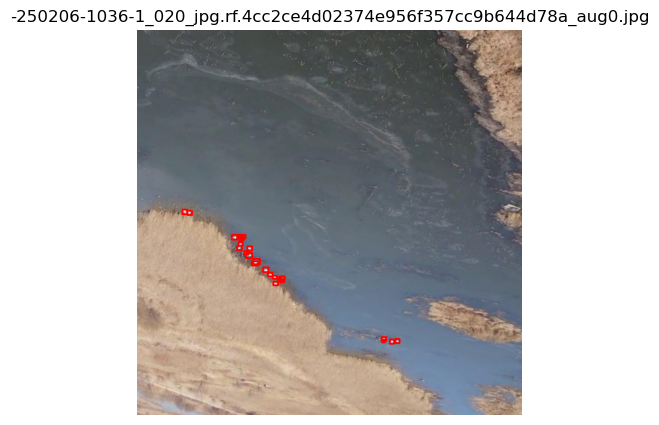

Labels for -250108-0934-1_037_jpg.rf.a8f86afc15071c8419da0ce86c03c75a_aug4.jpg:
0.0 0.8576208132784814 0.22068115535657853 0.02307032933458686 0.015611523622646927

0.0 0.873463639151305 0.25472026693169025 0.023449349217116833 0.016653419053182007

0.0 0.7744224761612714 0.2743102796608582 0.01673433557152748 0.022258566180244087

0.0 0.26249957175459715 0.4079161279601976 0.014606630662456155 0.014589598076418043

0.0 0.2531058062799275 0.4132364823482931 0.019345326349139214 0.021366799902170896

0.0 0.2027106849476695 0.45612618008162825 0.027425348293036222 0.02232637503184378

0.0 0.21990541680715978 0.41168997013010084 0.021227323450148106 0.01646272884681821

0.0 0.6605913290753961 0.37610459041316063 0.02377738058567047 0.019084153370931743

0.0 0.6442259893286973 0.28621312950272115 0.02495011640712619 0.01586385420523584

0.0 0.6109210181515664 0.3149468862917274 0.0228850026614964 0.018357648979872465

0.0 0.8257583592552692 0.29101040605455636 0.016592420171946287 0.019361

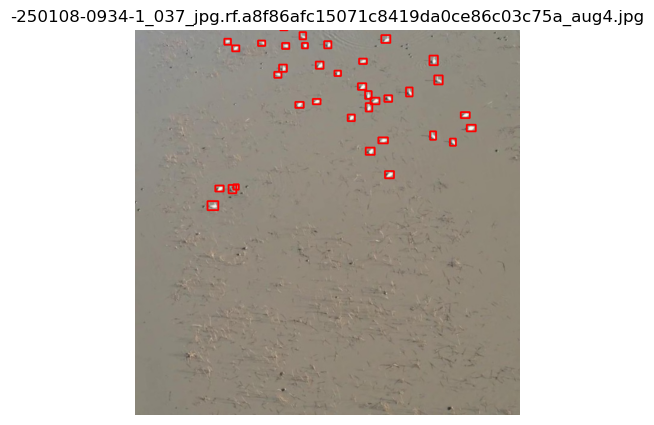

Labels for -250108-0934-1_037_jpg.rf.a8f86afc15071c8419da0ce86c03c75a_aug2.jpg:
0.0 0.9221280782483519 0.7506395834032447 0.02492716405540705 0.013211606722325086

0.0 0.931382189784199 0.7072579729836435 0.02510652970522642 0.014433411229401828

0.0 0.8121875626035034 0.7108255718834698 0.014874856732785702 0.02357240617275238

0.0 0.18755642916075885 0.6920100341551005 0.01440248368307948 0.014384595677256584

0.0 0.17533719087950886 0.688360979873687 0.018475500959903003 0.02166634500026703

0.0 0.10599707826040686 0.6522611974272877 0.028527808282524346 0.020525969658046962

0.0 0.13752273540012538 0.6989009444601834 0.022320488933473825 0.01484066192060709

0.0 0.6542661762796342 0.6236224867403507 0.02481305617839098 0.017447129264473914

0.0 0.6591537970118224 0.7314656629692763 0.02725705299526453 0.012983521167188882

0.0 0.6132258426398038 0.7071602107957006 0.023884717747569083 0.01677923183888197

0.0 0.8668809410184621 0.6780491008423268 0.015542909875512123 0.019906992651

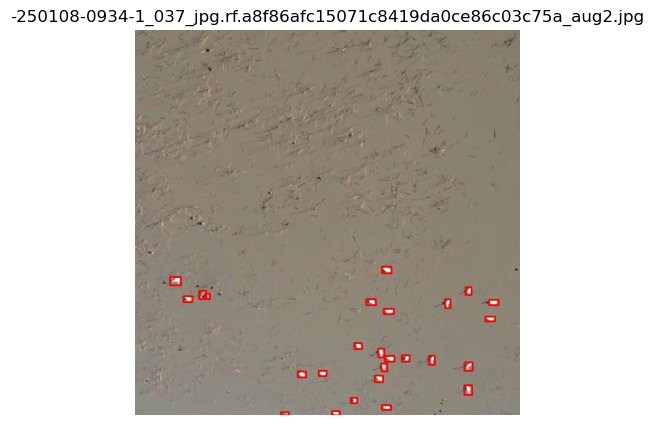

In [ ]:
def show_augmented_samples():
    sample_images = random.sample(os.listdir(aug_train_image_dir), 50)
    
    for img_name in sample_images:
        img_path = os.path.join(aug_train_image_dir, img_name)
        label_path = os.path.join(aug_train_label_dir, img_name.replace('.jpg', '.txt'))
        
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        
        plt.figure(figsize=(5, 5))
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                labels = f.readlines()
            
            for label in labels:
                parts = label.strip().split()
                if len(parts) != 5:
                    continue
                
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, parts)
                x_min = int((x_center - bbox_width / 2) * w)
                y_min = int((y_center - bbox_height / 2) * h)
                x_max = int((x_center + bbox_width / 2) * w)
                y_max = int((y_center + bbox_height / 2) * h)
                
                img = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
            
            print(f"Labels for {img_name}:")
            print("\n".join(labels))
        else:
            print(f"No labels found for {img_name}")
        
        plt.axis("off")
        plt.title(img_name)
        plt.imshow(img)
        
        plt.show()

# Augmentation 샘플 확인
show_augmented_samples()